## Building Syn Model from Scratch

Input variables:


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.dates as mdates #for working with dates in plots
from statsmodels.tsa.stattools import acf #compute autocorrelation
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels


In [3]:
PATH = "../data/dfmerged_dailysynenv.csv"
df = pd.read_csv(PATH).drop_duplicates(subset = "date") #remove duplicate days

#reformat dates to datetime format
df.year = pd.to_datetime(df.year, format = "%Y")
df.date = pd.to_datetime(df.date, format = "%Y-%m-%d")


#set daily frequency to data and fill missing days with NaNs
df.index = pd.DatetimeIndex(df.date)
df.asfreq("D")
df.head()

,date,AvgSolar,AvgWindDir,AvgWindSpeed,Beam_temperature_corrected,NH4_mean,NO3_mean,PO4_mean,SiO2_mean,doy,doy_numeric,month,monthname,synconc,year
date,,,,,,,,,,,,,,,
2003-05-10,2003-05-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900-05-10,130,5.0,May,354.187094,2003-01-01
2003-05-11,2003-05-11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900-05-11,131,5.0,May,381.916883,2003-01-01
2003-05-12,2003-05-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900-05-12,132,5.0,May,507.483356,2003-01-01
2003-05-13,2003-05-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900-05-13,133,5.0,May,704.463939,2003-01-01
2003-05-14,2003-05-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1900-05-14,134,5.0,May,898.691727,2003-01-01


In [4]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
AvgSolar,3074.0,149.891778,94.450048,-2.800000,74.079861,132.141071,228.845833,851.388235
AvgWindDir,3074.0,198.149130,72.314866,13.912500,150.370833,210.491024,252.054167,340.055556
AvgWindSpeed,3074.0,5.216600,2.309749,0.729167,3.635764,4.793056,6.316319,25.530556
Beam_temperature_corrected,3074.0,10.641422,6.403568,-1.419508,4.714215,10.633121,16.645245,21.855795
NH4_mean,1.0,0.668381,NaN,0.668381,0.668381,0.668381,0.668381,0.668381
NO3_mean,1.0,0.851722,NaN,0.851722,0.851722,0.851722,0.851722,0.851722
PO4_mean,1.0,0.684097,NaN,0.684097,0.684097,0.684097,0.684097,0.684097
SiO2_mean,1.0,1.138648,NaN,1.138648,1.138648,1.138648,1.138648,1.138648
doy_numeric,4741.0,187.139844,101.756282,1.000000,105.000000,187.000000,274.000000,366.000000
synconc,4007.0,41340.901393,49870.821503,50.135234,2136.244463,20649.215547,64946.696188,323472.170691


# Plotting Syn Concentration

In [13]:
plt.figure(figsize=(17, 4), dpi=1000)

sns.set(font_scale = 2, style = "whitegrid")
# for Palatino and other serif fonts use:
# plt.rcParams.update({
#     "text.usetex": True,
#     "font.family": "serif",
#     "font.serif": ["Computer Modern Roman"]})
mpl.rcParams.update(mpl.rcParamsDefault)

plt.rcParams.update({'font.size': 22})

# sns.scatterplot(data = df[::100], x = "date" , y = "synconc", s=100)
plt.scatter(df.index,df.synconc, s= 3)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.StrMethodFormatter('{x:,.0f}')) #adds commas to yaxis tick marks
plt.gca().xaxis.set_major_locator(mdates.YearLocator(2))
plt.xlabel("Year")
plt.ylabel("$\it{Syn}$ Concentration ($cells$ $mL^{-1}$)")
plt.title("$\it{Synechecoccus}$ Concentration at MVCO")
plt.grid()

# Log Transformation of $\it{Synechecoccus}$ Data

In [13]:
plt.figure(figsize=(15, 8), dpi=1000)

# for Palatino and other serif fonts use:
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"]})

# sns.scatterplot(data = df[::100], x = "date" , y = "synconc", s=100)
plt.scatter(df.index,np.log(df.synconc), s= 1)
plt.gca().yaxis.set_major_formatter(plt.matplotlib.ticker.StrMethodFormatter('{x:,.0f}')) #adds commas to yaxis tick marks
plt.gca().xaxis.set_major_locator(mdates.YearLocator(1))
plt.ylim(0,14)
plt.xlabel("Year")
plt.ylabel("$\it{Syn}$ Concentration log($cells$ $mL^{-1}$)")
plt.title("$\it{Synechecoccus}$ Concentration at MVCO")

Text(0.5, 1.0, '$\\it{Synechecoccus}$ Concentration at MVCO')

# Transforming Wind Data

The wind data column `AvgWindDir`—gives the wind direction in units of degrees. Angles do not make good model inputs: 360° and 0° should be close to each other and wrap around smoothly. Direction shouldn't matter if the wind is not blowing.

Right now the distribution of wind data looks like this:

Text(0.5, 1.0, 'Wind Direction vs. Wind Velocity')

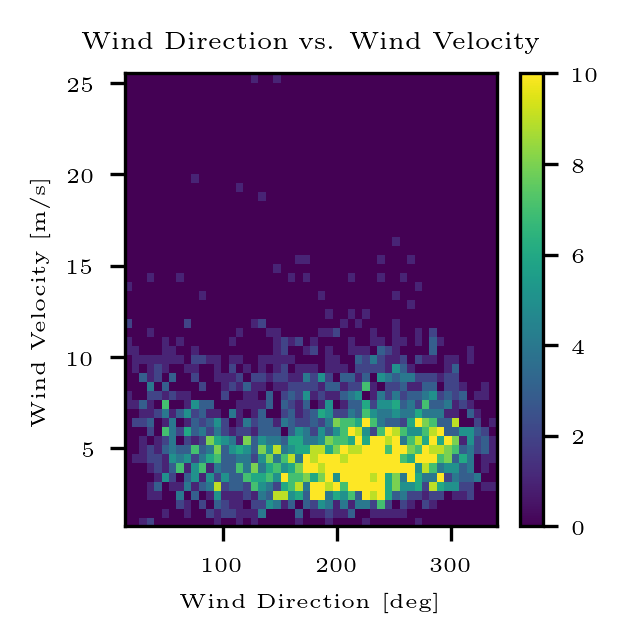

In [14]:
plt.figure(figsize=(2, 2), dpi=300)
mpl.rcParams.update(mpl.rcParamsDefault)
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
    "font.size": 5})


plt.hist2d(df['AvgWindDir'].dropna(), df['AvgWindSpeed'].dropna(), bins=(50, 50), vmax=10)
plt.colorbar()
plt.xlabel('Wind Direction [deg]')
plt.ylabel('Wind Velocity [m/s]')
plt.title("Wind Direction vs. Wind Velocity")

In [15]:
wv = df.AvgWindSpeed
# Convert to radians.
wd_rad = df.AvgWindDir*np.pi / 180
# Calculate the wind x and y components.
df['Wx'] = wv*np.cos(wd_rad)
df['Wy'] = wv*np.sin(wd_rad)

Text(0.5, 1.0, 'Wind X Vector vs. Wind Y Vector')

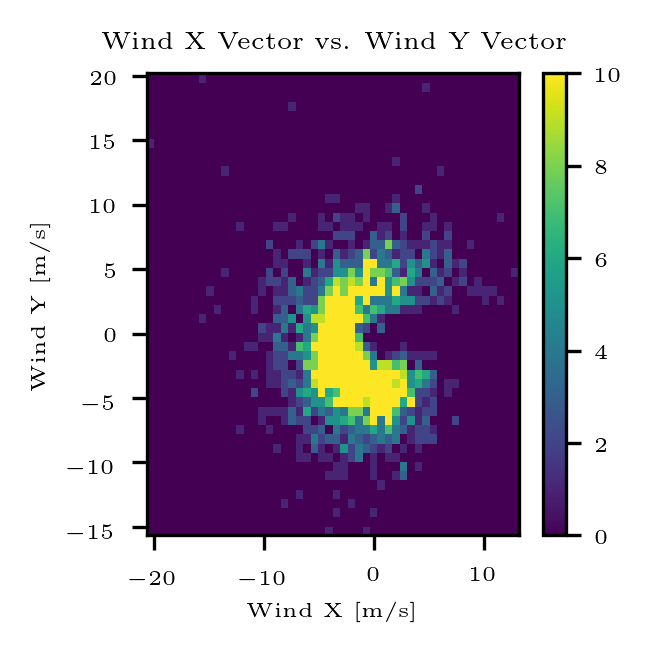

In [16]:
plt.figure(figsize=(2, 2), dpi=300)
mpl.rcParams.update(mpl.rcParamsDefault)
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
    "font.size": 5})

plt.hist2d(df['Wx'].dropna(), df['Wy'].dropna(), bins=(50, 50), vmax=10)
plt.colorbar()
plt.xlabel('Wind X [m/s]')
plt.ylabel('Wind Y [m/s]')
ax = plt.gca()

# ax.axis('tight')
plt.title("Wind X Vector vs. Wind Y Vector")

In [17]:
dfcol = df.Beam_temperature_corrected
dfcol.name

'Beam_temperature_corrected'

In [20]:
#NUMBER OF LAGS

dfcol = df.Beam_temperature_corrected
dfcol
nlag = 2000
#calcuate autocorrelation factor for ssyn values
acfout = acf(dfcol, nlags = nlag, missing = 'conservative')

acfseries =pd.Series(acfout)

x = np.linspace(1,nlag + 1, nlag + 1)

ac_threshold = 0.7
acfseries[acfseries >= ac_threshold].idxmin()
max_days = acfseries[acfseries >= ac_threshold].idxmin()
print("Max number of days (where AC >= threshold): " + str(max_days) + " days")

# acfseries[acfseries >= ac_threshold]

Max number of days (where AC >= threshold): 27 days


In [28]:
#FIGURE SIZE
plt.figure(figsize=(15, 8), dpi=1000)
#SCALE and GRID STYLE
sns.set(font_scale = 2, style = "whitegrid")
# FONT
mpl.rcParams.update(mpl.rcParamsDefault)
# plt.rcParams.update({"text.usetex": True,"font.family": "serif","font.serif": ["Computer Modern Roman"]})

plt.stem(x, acfout)
# plt.xlim([0,100])
# plt.axvline(x = acfseries[250:600].idxmax())
# plt.axvline(x = acfseries[600:800].idxmax())
# plt.axvline(x = acfseries[800:1250].idxmax())

plt.xlabel("Lag (Days)")
plt.ylabel("Autocorrelation")
plt.title( str(dfcol.name) + " autocorrelation over " + str(nlag) + " days")

#FIGURE SIZE
plt.figure(figsize=(15, 8), dpi=1000)
#SCALE and GRID STYLE
sns.set(font_scale = 2, style = "whitegrid")
# FONT
mpl.rcParams.update(mpl.rcParamsDefault)
# plt.rcParams.update({"text.usetex": True,"font.family": "serif","font.serif": ["Computer Modern Roman"]})

plt.stem(x, acfout)
plt.xlim([0,100])

#adding lines and labels
plt.stem(x[:max_days], acfout[:max_days],linefmt = 'C1')
# plt.axvline(x = max_days, color = "r", linestyle = 'dashed')
# plt.axhline(y=acfout[max_days-1], color='r', linestyle='dashed')
# plt.text(max_days + 1 ,1,str(max_days)+" days" ,color = "r")
# plt.xticks(np.arange(0, len(x)+1, 10))

plt.xlabel("Lag (days)")
plt.ylabel("Autocorrelation")
plt.title( str(dfcol.name) + " autocorrelation over 100 days")
# plt.title( "Variable " + " autocorrelation over 100 days")

Text(0.5, 1.0, 'Beam_temperature_corrected autocorrelation over 100 days')

## plotting Autocorrelation factor

The autocorrelation is supposed to tell me something about the seasonality of this time series. I want to assess the periodicity of this time series.

In [158]:
def autocorrelate(dfcol,nlag,ac_threshold):
    #NUMBER OF LAGS

    #calcuate autocorrelation factor for ssyn values
    acfout = acf(dfcol, nlags = nlag, missing = 'conservative')

    acfseries =pd.Series(acfout)
    
    ac_threshold = 0.7
    acfseries[acfseries >= ac_threshold].idxmin()
    max_days = acfseries[acfseries >= ac_threshold].idxmin()
    print("Max number of days (where AC >= threshold): " + str(max_days) + " days")


    x = np.linspace(1,nlag + 1, nlag + 1)

    #FIGURE SIZE
    plt.figure(figsize=(15, 8), dpi=1000)
    #SCALE and GRID STYLE
    sns.set(font_scale = 2, style = "whitegrid")
    # FONT
    plt.rcParams.update({"text.usetex": True,"font.family": "serif","font.serif": ["Computer Modern Roman"]})

    plt.stem(x, acfout)
    # plt.xlim([0,100])
    plt.xlabel("Lag")
    plt.ylabel("Autocorrelation")
    plt.title( str(dfcol.name) + " autocorrelation over " + str(nlag) + " days")

    #FIGURE SIZE
    plt.figure(figsize=(15, 8), dpi=1000)
    #SCALE and GRID STYLE
    sns.set(font_scale = 2, style = "whitegrid")
    # FONT
    plt.rcParams.update({"text.usetex": True,"font.family": "serif","font.serif": ["Computer Modern Roman"]})

    plt.stem(x, acfout)
    plt.xlim([0,100])

    #plotting labels to show points above threshold
    plt.stem(x[:max_days], acfout[:max_days],linefmt = 'C1')
    plt.axvline(x = max_days, color = "r", linestyle = 'dashed')
    plt.axhline(y=acfout[max_days-1], color='r', linestyle='dashed')
    plt.text(max_days + 1 ,1,str(max_days)+" days" ,color = "r")
    # plt.xticks(np.arange(0, len(x)+1, 10))

    # plt.xticks(np.arange(0, len(x)+1, 10))

    plt.xlabel("Lag (days)")
    plt.ylabel("Autocorrelation")
    plt.title( str(dfcol.name) + " autocorrelation over 100 days")
    
autocorrelate(df.synconc,2000,0.7)

Max number of days (where AC >= threshold): 7 days


In [159]:
autocorrelate(df.Beam_temperature_corrected,2000, 0.7)

Max number of days (where AC >= threshold): 27 days


RuntimeError: latex was not able to process the following string:
b'Beam_temperature_corrected autocorrelation over 2000 days'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.20 (TeX Live 2019/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/miras/.cache/matplotlib/tex.cache/84222d257b7d0ef00bdadc425fc42bd0.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty))

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
(./84222d257b7d0ef00bdadc425fc42bd0.aux)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...size{24.000000}{30.000000}{\rmfamily Beam_
                                                  temperature_corrected auto...
No pages of output.
Transcript written on 84222d257b7d0ef00bdadc425fc42bd0.log.




<Figure size 15000x8000 with 1 Axes>

RuntimeError: latex was not able to process the following string:
b'Beam_temperature_corrected autocorrelation over 100 days'

Here is the full report generated by latex:
This is pdfTeX, Version 3.14159265-2.6-1.40.20 (TeX Live 2019/Debian) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(/home/miras/.cache/matplotlib/tex.cache/01552d75bcc4b66fa050635a364740f3.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty))

Package geometry Warning: Over-specification in `h'-direction.
    `width' (5058.9pt) is ignored.


Package geometry Warning: Over-specification in `v'-direction.
    `height' (5058.9pt) is ignored.

) (/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
(./01552d75bcc4b66fa050635a364740f3.aux)
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing $ inserted.
<inserted text> 
                $
l.14 ...size{24.000000}{30.000000}{\rmfamily Beam_
                                                  temperature_corrected auto...
No pages of output.
Transcript written on 01552d75bcc4b66fa050635a364740f3.log.




<Figure size 15000x8000 with 1 Axes>

In [157]:
autocorrelate(df.AvgSolar,2000,0.7)

Max number of days (where AC >= threshold): 0 days


ValueError: zero-size array to reduction operation minimum which has no identity

# Quantifying Gaps in the time series

Identify gaps in time series to see which ones can be interpolated.

In [149]:

#input: name of variable in the dataframe
def find_gaps(dfcol):
    dfcol.isna().sum()
    idxnan = np.where(np.isnan(dfcol))
    idxnan[0]
    def ranges(nums):
        nums = sorted(set(nums))
        gaps = [[s, e] for s, e in zip(nums, nums[1:]) if s+1 < e]
        edges = iter(nums[:1] + sum(gaps, []) + nums[-1:])
        return list(zip(edges, edges))
    # df = pd.DataFrame(list_of_tuples, columns = ['Name', 'Age'])

    dfrange = pd.DataFrame(ranges(idxnan[0]),columns = ["gap_start","gap_end"])

    dfrange["gap_length"] = dfrange.gap_end-dfrange.gap_start
    return dfrange

find_gaps(df["synconc"]).gap_length[find_gaps(df["synconc"]).gap_length >= ]

0       2
1     139
2      15
3      36
4      44
5       1
6       1
7       1
8       1
9       0
10      0
11      1
12     52
13      3
14      0
15      3
16      2
17     17
18      6
19      2
20      0
21      7
22      5
23      3
24     22
25      5
26      0
27      8
28     16
29      3
30      1
31     14
32      3
33     13
34      1
35     43
36      1
37      5
38      9
39    128
40      9
41      2
42      3
43      2
44      8
45     10
46      8
47      0
48      1
49     13
50      1
51      2
52      9
Name: gap_length, dtype: int64

In [68]:
find_gaps(df["Beam_temperature_corrected"])

,gap_start,gap_end,gap_length
0,0,287,287
1,302,303,1
2,325,325,0
3,474,668,194
4,675,683,8
...,...,...,...
68,4265,4272,7
69,4303,4397,94
70,4466,4535,69
71,4692,4695,3


In [5]:
find_gaps(df["Beam_temperature_corrected"])

NameError: name 'find_gaps' is not defined

## Interpolation

In [177]:
np.log(df.synconc).interpolate(method = "spline",order = 3, limit = 7 )
plt.figure(figsize=(15, 8), dpi=1000)


plt.scatter(df.date,df.synconc, c = "b", marker = "o")
plt.scatter(df.date,np.exp(np.log(df.synconc).interpolate(method = "spline",order = 3, limit = 7 )),c = "r",marker = "+")
plt.title("Interpolation of Synechoccous Concentration")

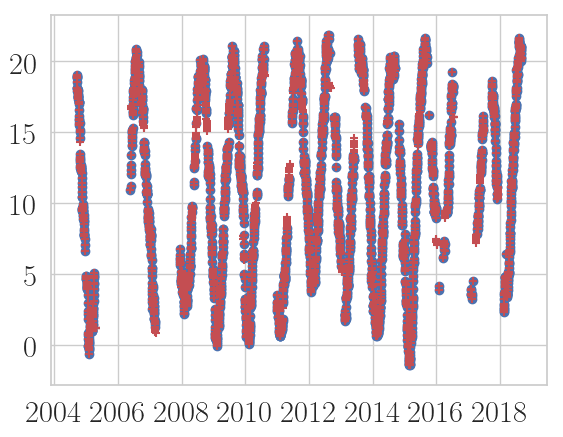

In [176]:
df.Beam_temperature_corrected.interpolate(method = "spline", order = 3, limit = 400)

plt.scatter(df.date,df.Beam_temperature_corrected, c = "b", marker = "o")
plt.scatter(df.date,df.Beam_temperature_corrected.interpolate(method = "spline",order = 3, limit = 7 ),c = "r",marker = "+")
plt.title("Interpolation of Temperature")

# Identifying Relevant Frequencies

In [87]:
from scipy.fft import fft, ifft

fftout = fft(df.synconc.values)

In [91]:
fperdataset = np.arange(0,len(fftout))
print(fperdataset)

[   0    1    2 ... 4004 4005 4006]


### Decorrelating Data with PCA

In [ ]:
from scipy.stats import pearsonr


In [ ]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False